# Pencocokan Kurva dan Animasi



## 1. Pencocokan Kurva


Pencocokan kurva (*curve fitting*) adalah cara membuat kurva (fungsi matematika) yang memiliki bentuk "*paling cocok*" dengan kumpulan data yang disediakan. Metode pencocokan kurva sering digunakan jika kita perlu membuat kurva yang menghampiri kumpulan data yang mengandung galat (misal, karena data tersebut adalah hasil observasi). Namun jika tidak ada galat di kumpulan data, kita dapat membuat kurva interpolasi yang *melewati* setiap kumpulan data. <sup>1</sup>

Secara matematis, misalkan diberikan $N$ buah prediktor $X_i = (x_1, x_2, ..., x_k)$, dan $y_i$ merupakan respons dari prediktor tersebut. Proses pencocokan kurva adalah metode menentukan nilai parameter $(a_1, a_2, ..., a_m)$ pada suatu fungsi $f(x_1, x_2, ..., x_k)$ sehingga  $|f(X_i) - y_i|$ bernilai minimum untuk semua nilai $i=1,2,\dots,N$. Untuk menentukan nilai parameter-parameter tersebut, kita dapat menggunakan fungsi ```curve_fit``` pada library ```scipy```. Berikut adalah potongan kode Python untuk melakukan pencocokan kurva:

```python
import scipy.optimize as optimize
parameter, pcov = optimize.curve_fit(f, X, y)
```

Disini, ```f``` merupakan fungsi yang akan di fitting, ```X``` merupakan array (kumpulan array, jika terdapat lebih dari 1 prediktor), dan ```y``` merupakan array respons. Fungsi ```curve_fit``` akan mengembalikan 2 buah variabel secara berurutan, yakni array parameter serta matriks kovariansi. Selain itu, indeks dari elemen pada parameter akan berkorespondensi dengan indeks pada parameter sebagai input di fungsi ```f```.

Fungsi ```f``` dapat dibangun dengan menggunakan fungsi biasa, dengan $m + 1$ buah masukan ($1$ dari prediktor (berapapun jumlah prediktornya), $m$ dari parameter). Secara umum:
```python
def f(X, a1, a2, ..., am):
    x1, x2, ..., xk = X
    return  # <fungsi matematika>
```

Untuk ```X``` dengan satu array prediktor, maka ```X = x```. Jika ```X``` terdiri dari k buah prediktor, maka ```X = (x1, x2, ..., xk)```. 


Secara umum & lengkap:
```python
import scipy.optimize as optimize


x1 = [x1_1, x1_2, ..., x1_n]
x2 = [x2_1, x2_2, ..., x2_n]
...
xk = [xk_1, xk_2, ..., xk_n]
X = (x1, x2, ..., xk)         # Menggunakan kurung biasa

y = [y_1, y_2, ..., y_n]



def f(X, a1, a2, ..., am):
    x1, x2, ..., xk = X
    return  # <fungsi matematika>

parameter, pcov = optimize.curve_fit(f, X, y)
# parameter akan bernilai [a1, a2, ..., am], sesuai dengan urutan pada ai di f
```

Mari kita lihat beberapa contoh pada bagian selanjutnya

### Contoh

#### 1 buah prediktor; dan 2 buah parameter.

Misalkan diberikan 6 data hasil observasi yang 'memiliki bentuk yang mirip' dengan fungsi $$f(x) = a + x^b$$ Untuk menentukan kurva hasil pencocokan, bentuk variabel ```x``` dan ```y``` yang masing-masing merupakan array berukuran 1x6. Selanjutnya, konstanta $a$ dan $b$ terbaik pada fungsi $f$ dapat ditemukan dengan menggunakan ```curve_fit``` pada ```scipy```:

didapatkan [a, b] = [1.49811485 1.96505321]


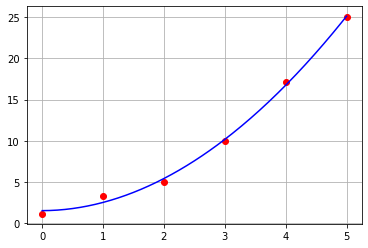

In [ ]:
import scipy.optimize as optimize
import matplotlib.pyplot as plt


## Pencocokan Kurva
x = [0, 1, 2, 3, 4, 5]
y = [1.1, 3.32, 4.95, 9.93, 17.12, 25.01]

def f(x, a, b):
    return a + x**b

parameter, pcov = optimize.curve_fit(f, x, y)
print("didapatkan [a, b] =", parameter)


## Buat Grafik

# Bentuk interval nilai x untuk plot
x_kiri  = 0
x_kanan = 5
Nx = 201
dx = (x_kanan - x_kiri)/(Nx - 1)

# Bentuk kurva fungsi f
a = parameter[0]
b = parameter[1]
x_fitting = [i*dx for i in range(Nx)]
y_fitting = [f(i*dx, a, b) for i in range(Nx)]

# kode x_fitting dapat diganti dengan np.arange(x_kiri, x_kanan, dx)
# maupun dengan np.linspace(x_kiri, x_kanan, Nx) karena nilainya setara

# Buat plot
plt.plot(x, y, 'ro')
plt.plot(x_fitting, y_fitting, 'b')
plt.grid()
plt.show()

#### 2 buah prediktor; dan 3 buah parameter

Misalkan diberikan data ```x1```, ```x2```, dan ```y``` yang merupakan array berukuran 1x6. Akan dicari konstanta $a$, $b$, dan $c$ terbaik pada persamaan linear $f(x) = a + b x_1 + c x_2$ menggunakan ```curve_fit``` pada ```scipy```

In [ ]:
import scipy.optimize as optimize
import matplotlib.pyplot as plt

x1 = [0, 1, 2, 3, 4, 5]
x2 = [0, 2, 2, 2, 3, 5]
y = [1.01, 5.83, 7.04, 8.12, 11.21, 16.43]
X = (x1, x2)

def f(X, a, b, c):
    x1, x2 = X
    return a + b*x1 + c*x2

parameter, pcov = optimize.curve_fit(f, X, y)
print(parameter)
# a = 0.87910714, b = 1.11785714, c = 1.97125

[0.87910714 1.11785714 1.97125   ]


**Footnote:**
1. Hanya gambaran kasar, penjelasan lebih dalam tentang pencocokan kurva dengan interpolasi dapat ditemui di mata kuliah Matematika Numerik, atau setidaknya dengan mencari di Internet.


## 2. Cara Membuat Animasi

Ada pepatah berbahasa inggris mengatakan: "*A picture is worth a thousand words*". Pepatah tersebut memiliki arti bahwa, sebuah gambar dapat menjelaskan seribu kata. Bayangkan jika kita memiliki sebuah video 30 fps (*frame per second* atau gambar per detik) dengan durasi 10 detik. Terdapat 300 gambar pada video tersebut. Artinya video tersebut setara dengan **300 ribu kata!**. Itu hanya dari video berdurasi 10 detik. Apalagi jika durasinya lebih lama, tentu semakin banyak informasi yang kita dapat berikan. (Catatan: namun, tolong selama praktikum kali ini animasinya jangan berdurasi terlalu lama.)

Itulah pentingnya kita membuat sebuah video, khususnya pada praktikum kali ini, berupa animasi. Terdapat beberapa hal yang dapat kita animasikan, seperti titik yang bergerak terhadap waktu, kurva yang berubah-ubah, bahkan hingga menganimasikan pergerakan hewan seperti semut dan sapi. Pada modul ini, kita akan melihat bagaimana struktur dalam pembuatan animasi menggunakan matplotlib. Selain itu, akan diberikan juga contoh-contoh untuk memberikan gambaran yang lebih lanjut.

### Animasi dengan `matplotlib`



Sebelum melakukan animasi, kita perlu mengimport tiga buah library/modul berikut:
```python
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
```

Animasi pada matplotlib menggunakan fungsi `FuncAnimation()`, yang dapat dipanggil dari `matplotlib.animation`. Untuk menggunakannya, anda dapat menulis `import matplotlib` lalu memanggil fungsi `matplotlib.animation.FuncAnimation()`; namun anda juga bisa menulis `import matplotlib.animation as animation` lalu cukup memanggil `animation.FuncAnimation()`.

Fungsi `FuncAnimation()`  membutuhkan beberapa masukan, yakni:
- `fig`: Figure yang akan digunakan. Secara *sangat* kasar, figure adalah window (gambar yang muncul saat plot dijalankan).
- `func`: **Fungsi iterasi**, fungsi ini akan menentukan bagaimana animasi akan berjalan.
- `frames`: Iterasi yang perlu dilakukan. Di praktikum ini, cukup dalam `[1, 2, ..., i, ..., N]`, dengan `N` merupakan banyak iterasi animasi. Secara kasar, frame dapat dianggap sebagai "Bagaimana bentuk dan posisi kurva pada gambar ke-i")
- `blit`: Apakah metode blitting (yang digunakan untuk optimisasi) digunakan atau tidak. Karena kita tidak akan menggunakannnya dalam praktikum ini, `blit = False`.
- `interval`: Waktu delay  (dalam milisekon) antar gambar yang dihasilkan. Sebagai contoh, animasi 30 fps didapatkan dengan `interval = 1000/30`. Masukan ini digunakan saat tidak menggunakan Colab atau Jupyter, untuk menentukan kecepatan animasi atau ke-"smooth"-an animasi.
- `init_func`: Fungsi yang akan di run sebelum looping animasi dimulai

Pada bagian selanjutnya, kita akan melihat struktur yang secara umum digunakan pada praktikum ini untuk melakukan animasi

### Struktur Animasi

Untuk membangun animasi dari sebuah plot secara umum, urutan yang dilakukan adalah:

1. Deklarasi figure, plot, maupun benda-benda lain (kurva, titik, bidang, dll) yang akan digunakan
2. Menyiapkan fungsi ```init_func``` dan ```func```. Fungsi ```func``` pada contoh akan diberi nama ```animate```.
3. Menggunakan fungsi ```funcAnimation```
4. Menampilkan hasil:

Berikut penjelasan singkat masing-masing tahapan:


#### 1. Deklarasi figure, plot, objek lain

**Deklarasi figure, plot:**

Untuk membuat figure dan bidang plot yang digunakan, kita panggil: ```fig, ax = plt.subplots()```. Setelah itu, anda dapat memanggil ```ax.``` untuk mengganti property dari plot yg digunakan (seperti batas penampilan plot, grid, dll). Silahkan cek kembali modul praktikum sebelumnya atau cari di google mengenai fungsi yang ingin digunakan.

**Deklarasi objek lain (kurva, titik, dll):**

Untuk Menampilkan objek lain, caranya agak berbeda dengan sebelumnya, karena kita ingin objek tersebut ada pada plot yang digunakan. Sehingga untuk memenuhi itu, kita dapat gunakan ```objek = plt.plot(x, y)```, dengan ```objek``` merupakan nama objek (bebas), ```x``` dan ```y``` merupakan nilai x dan y dari objek tersebut (dapat berupa array untuk mendandakan kurva atau kumpulan titik, atau float/int saja)

#### 2. Menyiapkan fungsi `init_func` dan `func`


**Fungsi** ```init_func```:

Pada praktikum ini, ```init_func``` tidak perlu mengembalikan suatu nilai. Sehingga cukup diberikan ```return None```. Sehingga cukup:

```python
def init():
    return None
```

**Fungsi** ```animate``` (looping):

Ini merupakan bagian utama dari animasi. Pada bagian ini, biasanya anda akan mengganti nilai x dan y sehingga pada iterasi ke i, x akan bernilai x(i) dan y bernilai y(i), tergantung dengan bentuk garis/titik seperti apa yang diinginkan. Untuk melakukan hal tersebut, dapat digunakan fungsi ```set_data``` pada titik dan kurva yang diinginkan. Sebagai contoh (titik ```dot```):

```python
def animate(i):
    dot.set_data(xi, yi)
```

Selain itu, fungsi ```animate``` memerlukan satu masukan ```i``` (nantinya menyatakan iterasi looping) serta keluaran variable titik/kurva yang digunakan.
Sehingga, secara lengkap (contoh):

```python
def animate(i):
    dot.set_data(xi, yi)
    return dot
```

#### 3. Fungsi `funcAnimation`

Karena sebelumnya sudah melakukan ```import matplotlib.animation as animation```, maka kita hanya perlu memanggil fungsi ```funcAnimation``` dengan cara:

```python
anim = animation.FuncAnimation(fig, animate, frames=[1, 2, ..., Nt], 
                               blit=False, interval=k, init_func=init)
```

Untuk suatu figure ```fig```, fungsi looping ```animate```, frames ```[1, 2, ..., Nt] = range(1, Nt, 1)```, blit bernilai ```False```, suatu interval ```k```, serta initial function ```init```.

#### 4. Menampilkan plot animasi

Pada Colab/Jupyter, silahkan gunakan:
```python
from matplotlib import rc
from IPython.display import HTML
rc('animation', html='jshtml')
anim
```
dengan ```anim``` merupakan variable yang didefinisikan pada no 3 sebelumnya.

Jika anda tidak menggunakan Colab/Jupyter atau sejenisnya, anda dapat menggunakan menggunakan `plt.show()` setelah `anim = animation.FuncAnimation(...)`.

### Contoh

#### Menggerakkan suatu titik

Diberikan lintasan berbentuk lingkaran, dengan jari-jari $1$ dan pusat $(0, 0)$. Sehingga, persamaan parametrik dari lintasan tersebut adalah $x(t) = cos(t)$ serta $y(t) = sin(t)$.

Akan dianimasikan sebuah titik, dimulai dari $(0, 1)$ dengan arah berlawanan jarum jam melalui lintasan lingkaran yang dipaparkan sebelumnya. Sehingga posisi dari titik tersebut adalah $(x(t), y(t))$, dengan $x(t) = cos(t + \frac{\pi}{2})$ serta $y(t) = sin(t + \frac{\pi}{2})$.

Silahkan amati gambar dibawah untuk membantu dalam menentukan bagaimana isi fungsi ```animate / func```

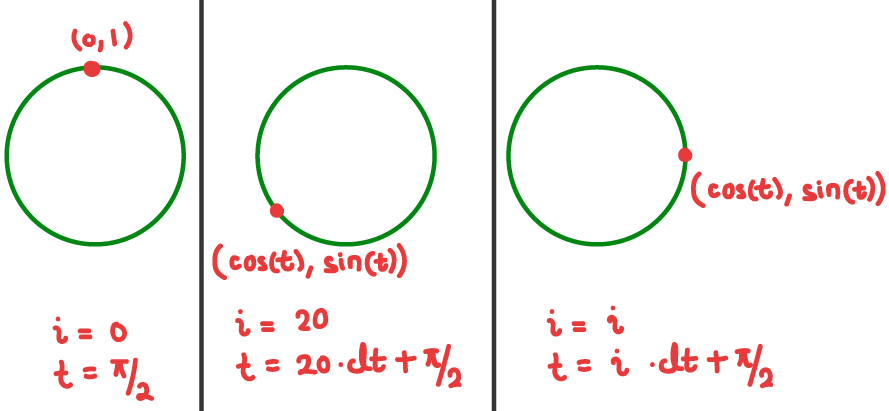

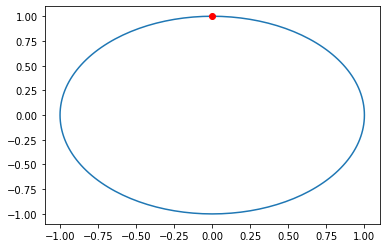

In [ ]:
# Library/fungsi yang wajib ada
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
# Library/fungsi tambahan (bisa kosong)
from math import sin, cos, pi

# Menyiapkan figure, plot
fig, ax = plt.subplots()

# Menyiapkan lintasan/kurva berbentuk lingkaran
Nt = 201 # 201 titik, artinya ada 200 partisi garis
dt = 2*pi/(Nt - 1)
x_lingkaran = [cos(i*dt + pi/2) for i in range(Nt)]
y_lingkaran = [sin(i*dt + pi/2) for i in range(Nt)]
lingkaran = plt.plot(x_lingkaran, y_lingkaran)

# Menyiapkan titik saat t = 0
red_dot, = plt.plot(cos(0 + pi/2), sin(0 + pi/2), 'ro')

# Fungsi iterasi animasi
def animate(i):
    # Pada iterasi ke-i, red_dot berada pada posisi (sin(x(i)), cos(y(i)))
    red_dot.set_data(x_lingkaran[i], y_lingkaran[i])
    return red_dot

# Fungsi init
def init():
    return None

anim = animation.FuncAnimation(fig, animate, frames=range(1, Nt, 1), blit=False,
                               interval=10, init_func=init)

# Kode tambahan jika dijalankan di colab/jupyter
from matplotlib import rc
from IPython.display import HTML
rc('animation', html='jshtml')
anim

#### Menggerakkan suatu kurva

Sebagai contoh, kita akan membuat animasi pergerakkan garis singgung dari fungsi parabola $f(x) = (x - 1)(x - 3)$. Garis singgung akan dimulai dari titik $(-3, f(-3))$ hingga $(7, f(7))$.

Silahkan perhatikan gambar di bawah untuk memberikan gambaran mengenai pendefinisian kurva, titik, serta bagaimana pada bagian ```func / animate```

(sebagai catatan, pada program ini array $t$ (disinggung pada gambar) akan diberi nama / menggunakan ```x```)



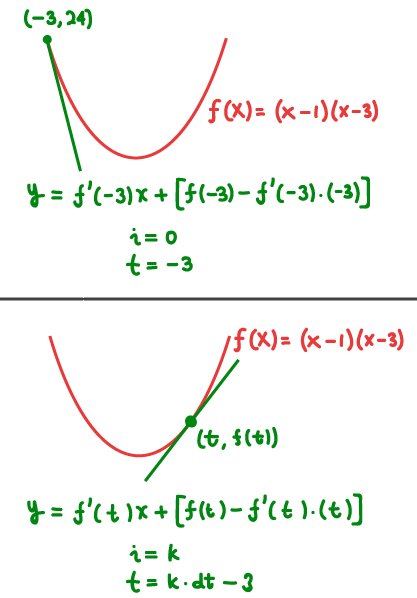

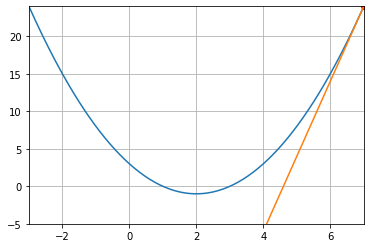

In [ ]:
# Library/fungsi yang wajib ada
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
# Library/fungsi tambahan (bisa kosong)
from math import sin, cos, pi

# Menyiapkan figure, plot
fig, ax = plt.subplots()
ax.grid(True)   # Untuk menampilkan grid kotak2

# Fungsi f(x) = x^2 - 4x + 3
def f(x): return x**2 - 4*x + 3
# Menyiapkan lintasan/kurva berbentuk parabola
Nt = 201 # 201 titik, artinya ada 200 partisi garis
x_kiri = -3
x_kanan = 7
dx = (x_kanan - x_kiri)/(Nt - 1)
x = [x_kiri + dx*i for i in range(Nt)]      # x = [-3, ..., 7]
y = [f(x[i]) for i in range(Nt)]
plt.plot(x, y)

# Menyiapkan titik saat t = 0
# Titik akan digunakan pada animasi
red_dot, = plt.plot(x[0], y[0], 'ro')

# Turunan dari fungsi f(x) -> untuk gradien
def g(x): return 2*x - 4
# Garis singgung pada titik (x(0), y(0)) (akan dianimasikan)
y2 = [g(x[0])*i*dx + (y[0] - g(x[0])*x[0]) for i in range(Nt)]
line2, = plt.plot(x[:], y2[:])


# Fungsi iterasi animasi
def animate(i):
    # Pada iterasi ke-i, titik berada pada posisi (x(i), f(x(i)))
    red_dot.set_data(x[i], y[i])
    # Garis singgung pada titik (x(t(i)), y(t(i)))
    y2 = [g(x[i])*x[j] + (y[i] - g(x[i])*x[i]) for j in range(Nt)]
    line2.set_data(x[:], y2[:])
    return red_dot, line2

# Fungsi init
def init():
    # Kedua baris dibawah dapat disimpan di init() atau diluar (setelah menyiapkan figure, plot)
    ax.set_xlim(x_kiri, x_kanan)
    ax.set_ylim(-5, f(x_kiri))
    return None

anim = animation.FuncAnimation(fig, animate, frames=range(1, Nt, 1), blit=False,
                               interval=10, init_func=init)

# Kode tambahan jika dijalankan di colab/jupyter
from matplotlib import rc
from IPython.display import HTML
rc('animation', html='jshtml')
anim

#### Dan lain lain

Beberapa animasi lain yang mungkin:

- Memunculkan titik/kurva secara bertahap (semakin lanjut iterasi, kurva akan semakin lengkap / titik akan semakin banyak). Silahkan gunakan:
 ```python
 kurva.set_data(x[:i], y[:i])
 titik.set_data(x[:i], y[:i], "o")
 ```

 dengan ```x``` dan ```y``` merupakan kumpulan titik (array)